# pix2pix for Maps to Aerial Image Translation

In [1]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
import pixutils as pxu
from pix2pix import UNet, PatchGAN, fit
import wandb
import os

In [2]:
wandb.login()

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [3]:
train_path = "pix2pix-maps/train/*.jpg"
val_path = "pix2pix-maps/val/*.jpg"

buffer_size = 256
image_size = 256

config = {
    "batch_size": 1,
    "lr_gen": 0.0002,
    "beta_1_gen": 0.5,
    "lr_disc": 0.0002,
    "beta_1_disc": 0.5,
    "l1_lambda": 100,
}

## Run the following code block on Kaggle only

In [4]:
train_path = f"/kaggle/input/{train_path}"
val_path = f"/kaggle/input/{val_path}"

## Load dataset

In [5]:
train = tf.data.Dataset.list_files(train_path)
val = tf.data.Dataset.list_files(val_path)

In [6]:
train = train.map(pxu.load_image)
train = train.map(lambda input_image, real_image: pxu.resize_images(input_image, real_image, image_size))
train = train.map(lambda input_patches, real_patches: pxu.random_jitter(input_patches, real_patches, 286))
train = train.map(pxu.rescale_images)
train = train.shuffle(buffer_size)
train = train.batch(config["batch_size"])

val = val.map(pxu.load_image)
val = val.map(lambda input_image, real_image: pxu.resize_images(input_image, real_image, image_size))
val = val.map(pxu.rescale_images)
val = val.batch(config["batch_size"])

## Visualize a few images

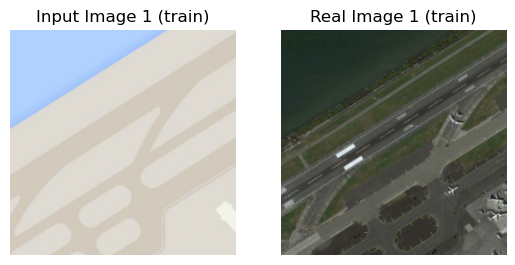

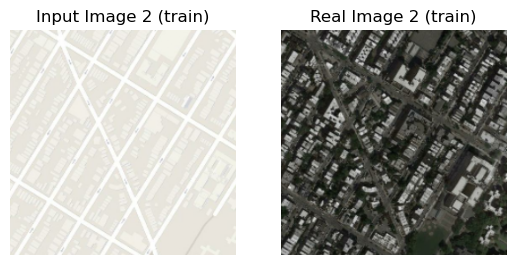

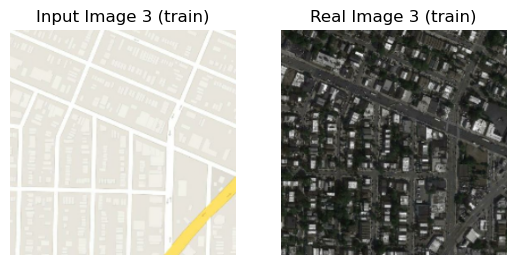

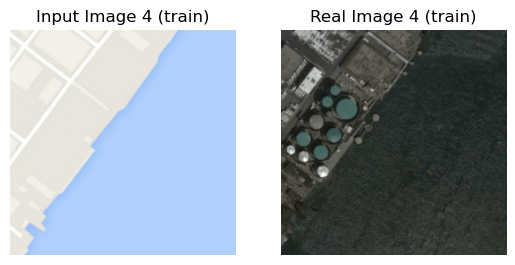

In [7]:
i = 0
for input_batch, real_batch in train.take(4):
    for input_image, real_image in zip(input_batch, real_batch):
        i += 1
        pxu.show(
            input_image,
            real_image,
            i,
            "train"
        )

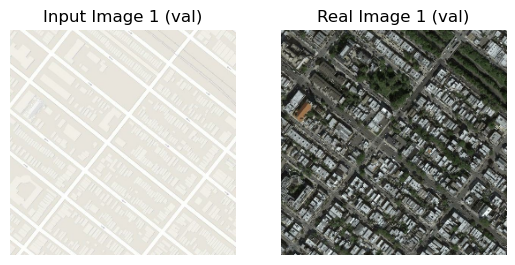

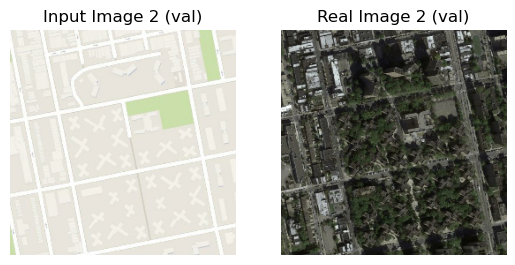

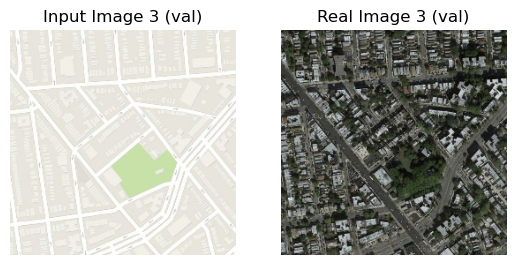

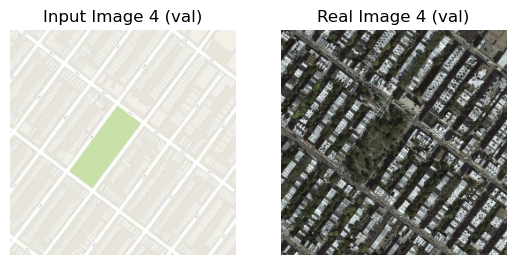

In [8]:
i = 0
for input_batch, real_batch in val.take(4):
    for input_image, real_image in zip(input_batch, real_batch):
        i += 1
        pxu.show(
            input_image,
            real_image,
            i,
            "val"
        )

## Create models

In [9]:
G = UNet(input_shape=(image_size, image_size, 3))
D = PatchGAN(input_shape=(image_size, image_size, 3))

config["epochs"] = 400

restore_last_epoch = 200
restore_run_id = "3cvixm8r"

if restore_last_epoch is not None:
    config["epochs"] -= restore_last_epoch
    run_path = f"nsiete23/pix2pix/{restore_run_id}"
    gen_file = wandb.restore(f"checkpoints/generator_{restore_last_epoch}.h5", run_path=run_path)
    disc_file = wandb.restore(f"checkpoints/discriminator_{restore_last_epoch}.h5", run_path=run_path)
    G = load_model(gen_file.name)
    D = load_model(disc_file.name)
    print(
        "Resumed:",
        gen_file.name,
        disc_file.name,
        sep=os.linesep
    )

g_optim = Adam(learning_rate=config["lr_gen"], beta_1=config["beta_1_gen"])
d_optim = Adam(learning_rate=config["lr_disc"], beta_1=config["beta_1_disc"])

Resumed:
/kaggle/working/checkpoints/generator_200.h5
/kaggle/working/checkpoints/discriminator_200.h5


## Train

wandb: Currently logged in as: v-modroczky (nsiete23). Use `wandb login --relogin` to force relogin


2023-05-02 21:35:08.231038: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/sequential_8/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Epoch: 1, Step: 1096, Gen Loss: 32.1291, Disc Loss: 0.3844


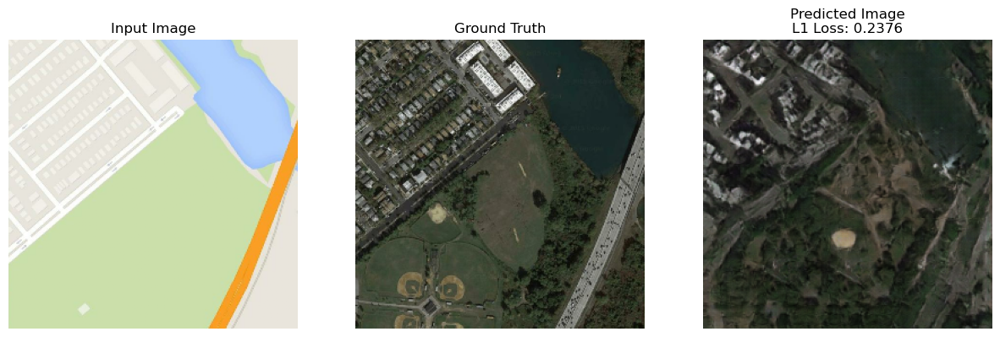

Epoch: 2, Step: 1096, Gen Loss: 21.3039, Disc Loss: 0.7290
Epoch: 3, Step: 1096, Gen Loss: 30.0795, Disc Loss: 0.1477
Epoch: 4, Step: 1096, Gen Loss: 9.9368, Disc Loss: 1.13136
Epoch: 5, Step: 1096, Gen Loss: 36.1896, Disc Loss: 0.3292
Epoch: 6, Step: 1096, Gen Loss: 25.0386, Disc Loss: 0.1005
Epoch: 7, Step: 1096, Gen Loss: 8.9101, Disc Loss: 0.49328
Epoch: 8, Step: 1096, Gen Loss: 30.9047, Disc Loss: 0.7409
Epoch: 9, Step: 1096, Gen Loss: 21.6085, Disc Loss: 0.3674
Epoch: 10, Step: 1096, Gen Loss: 24.4936, Disc Loss: 1.5852


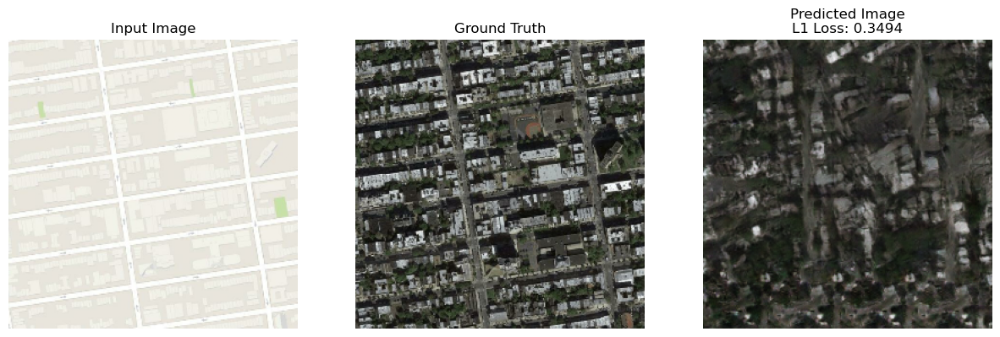

Epoch: 11, Step: 1096, Gen Loss: 12.3660, Disc Loss: 0.3893
Epoch: 12, Step: 1096, Gen Loss: 23.5200, Disc Loss: 0.2879
Epoch: 13, Step: 1096, Gen Loss: 5.7769, Disc Loss: 0.65590
Epoch: 14, Step: 1096, Gen Loss: 28.7992, Disc Loss: 0.0690
Epoch: 15, Step: 1096, Gen Loss: 31.9529, Disc Loss: 0.0942
Epoch: 16, Step: 1096, Gen Loss: 19.8445, Disc Loss: 0.6389
Epoch: 17, Step: 1096, Gen Loss: 19.5843, Disc Loss: 0.8480
Epoch: 18, Step: 1096, Gen Loss: 30.5699, Disc Loss: 0.1026
Epoch: 19, Step: 1096, Gen Loss: 17.9245, Disc Loss: 0.4926
Epoch: 20, Step: 1096, Gen Loss: 25.3746, Disc Loss: 0.0601


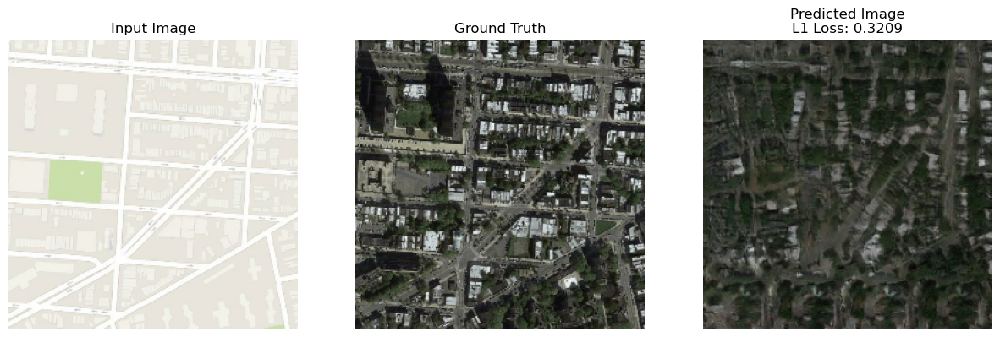

Epoch: 21, Step: 1096, Gen Loss: 27.2717, Disc Loss: 0.6593
Epoch: 22, Step: 1096, Gen Loss: 28.8308, Disc Loss: 0.0600
Epoch: 23, Step: 1096, Gen Loss: 27.4814, Disc Loss: 1.2630
Epoch: 24, Step: 1096, Gen Loss: 15.8173, Disc Loss: 0.1075
Epoch: 25, Step: 1096, Gen Loss: 19.1307, Disc Loss: 0.2903
Epoch: 26, Step: 1096, Gen Loss: 16.5857, Disc Loss: 0.3720
Epoch: 27, Step: 1096, Gen Loss: 14.2794, Disc Loss: 0.4849
Epoch: 28, Step: 1096, Gen Loss: 26.8013, Disc Loss: 0.5164
Epoch: 29, Step: 1096, Gen Loss: 24.3258, Disc Loss: 1.1229
Epoch: 30, Step: 1096, Gen Loss: 29.7924, Disc Loss: 0.8240


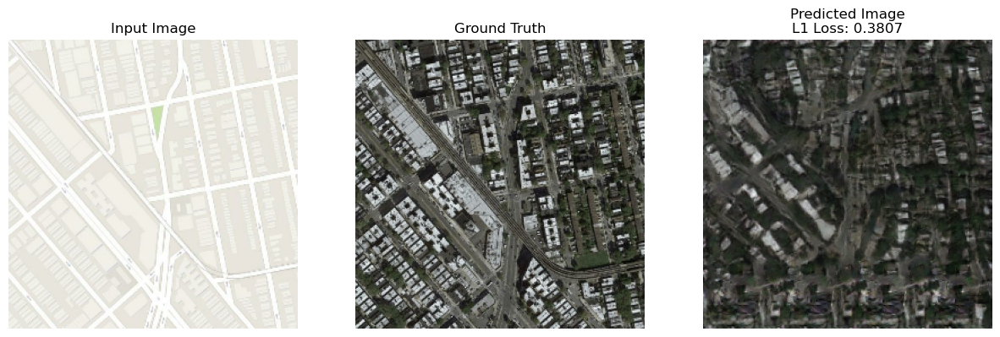

Epoch: 31, Step: 1096, Gen Loss: 26.6409, Disc Loss: 0.9368
Epoch: 32, Step: 1096, Gen Loss: 28.7600, Disc Loss: 0.1381
Epoch: 33, Step: 1096, Gen Loss: 11.6182, Disc Loss: 0.9484
Epoch: 34, Step: 1096, Gen Loss: 16.5813, Disc Loss: 0.5877
Epoch: 35, Step: 1096, Gen Loss: 25.0026, Disc Loss: 0.6240
Epoch: 36, Step: 1096, Gen Loss: 12.7349, Disc Loss: 0.8378
Epoch: 37, Step: 1096, Gen Loss: 26.0811, Disc Loss: 0.8213
Epoch: 38, Step: 1096, Gen Loss: 17.1945, Disc Loss: 0.7788
Epoch: 39, Step: 1096, Gen Loss: 8.0595, Disc Loss: 0.46773
Epoch: 40, Step: 1096, Gen Loss: 29.1222, Disc Loss: 0.5126


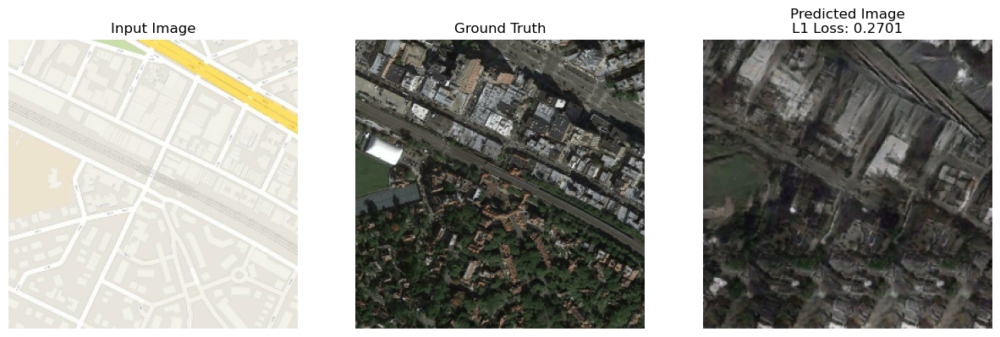

Epoch: 41, Step: 1096, Gen Loss: 35.1867, Disc Loss: 0.2376
Epoch: 42, Step: 1096, Gen Loss: 35.4832, Disc Loss: 0.1081
Epoch: 43, Step: 1096, Gen Loss: 22.7990, Disc Loss: 0.4737
Epoch: 44, Step: 1096, Gen Loss: 34.7873, Disc Loss: 0.2102
Epoch: 45, Step: 1096, Gen Loss: 4.4694, Disc Loss: 0.62953
Epoch: 46, Step: 1096, Gen Loss: 16.2116, Disc Loss: 1.5257
Epoch: 47, Step: 1096, Gen Loss: 35.8455, Disc Loss: 0.1794
Epoch: 48, Step: 1096, Gen Loss: 27.5129, Disc Loss: 0.7321
Epoch: 49, Step: 1096, Gen Loss: 25.6692, Disc Loss: 0.9710
Epoch: 50, Step: 1096, Gen Loss: 26.5193, Disc Loss: 0.2171


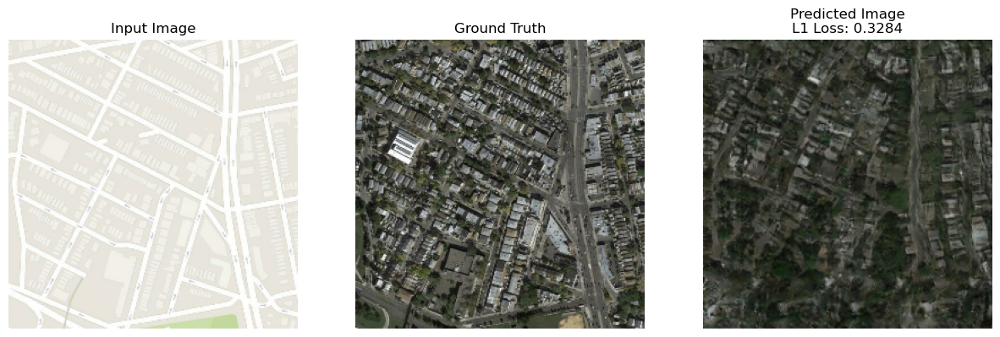

Epoch: 51, Step: 1096, Gen Loss: 34.5251, Disc Loss: 0.1670
Epoch: 52, Step: 1096, Gen Loss: 20.6513, Disc Loss: 0.4843
Epoch: 53, Step: 1096, Gen Loss: 29.1283, Disc Loss: 0.2297
Epoch: 54, Step: 1096, Gen Loss: 25.2946, Disc Loss: 1.0405
Epoch: 55, Step: 1096, Gen Loss: 27.0462, Disc Loss: 1.4063
Epoch: 56, Step: 1096, Gen Loss: 28.1085, Disc Loss: 1.5255
Epoch: 57, Step: 1096, Gen Loss: 25.4749, Disc Loss: 0.5550
Epoch: 58, Step: 1096, Gen Loss: 30.0874, Disc Loss: 0.2391
Epoch: 59, Step: 1096, Gen Loss: 27.1073, Disc Loss: 0.1366
Epoch: 60, Step: 1096, Gen Loss: 36.3900, Disc Loss: 0.1189


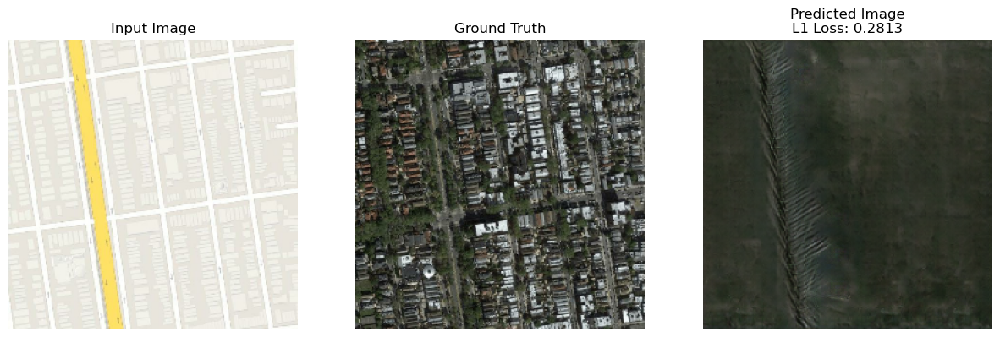

Epoch: 61, Step: 1096, Gen Loss: 26.4455, Disc Loss: 0.3925
Epoch: 62, Step: 1096, Gen Loss: 25.8836, Disc Loss: 0.5916
Epoch: 63, Step: 1096, Gen Loss: 18.3943, Disc Loss: 0.7444
Epoch: 64, Step: 1096, Gen Loss: 24.2992, Disc Loss: 0.8232
Epoch: 65, Step: 1096, Gen Loss: 4.9044, Disc Loss: 1.40365
Epoch: 66, Step: 1096, Gen Loss: 30.6785, Disc Loss: 1.6274
Epoch: 67, Step: 1096, Gen Loss: 25.5940, Disc Loss: 0.7205
Epoch: 68, Step: 1096, Gen Loss: 30.8782, Disc Loss: 1.1214
Epoch: 69, Step: 1096, Gen Loss: 30.6836, Disc Loss: 0.2550
Epoch: 70, Step: 1096, Gen Loss: 22.6253, Disc Loss: 2.0189


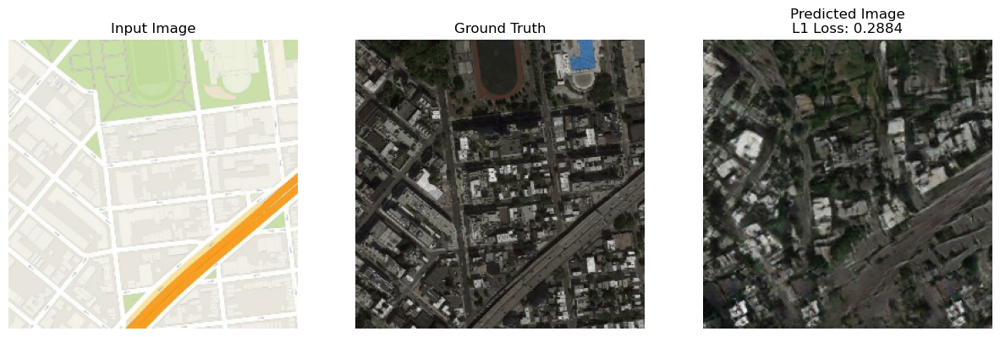

Epoch: 71, Step: 1096, Gen Loss: 32.4571, Disc Loss: 0.3535
Epoch: 72, Step: 1096, Gen Loss: 24.6345, Disc Loss: 0.1815
Epoch: 73, Step: 1096, Gen Loss: 34.0854, Disc Loss: 0.8344
Epoch: 74, Step: 1096, Gen Loss: 17.3327, Disc Loss: 0.7157
Epoch: 75, Step: 1096, Gen Loss: 24.8642, Disc Loss: 1.0105
Epoch: 76, Step: 1096, Gen Loss: 6.3197, Disc Loss: 1.46410
Epoch: 77, Step: 1096, Gen Loss: 25.5738, Disc Loss: 0.0243
Epoch: 78, Step: 1096, Gen Loss: 16.4382, Disc Loss: 0.8178
Epoch: 79, Step: 1096, Gen Loss: 32.5953, Disc Loss: 0.0869
Epoch: 80, Step: 1096, Gen Loss: 12.6726, Disc Loss: 0.5455


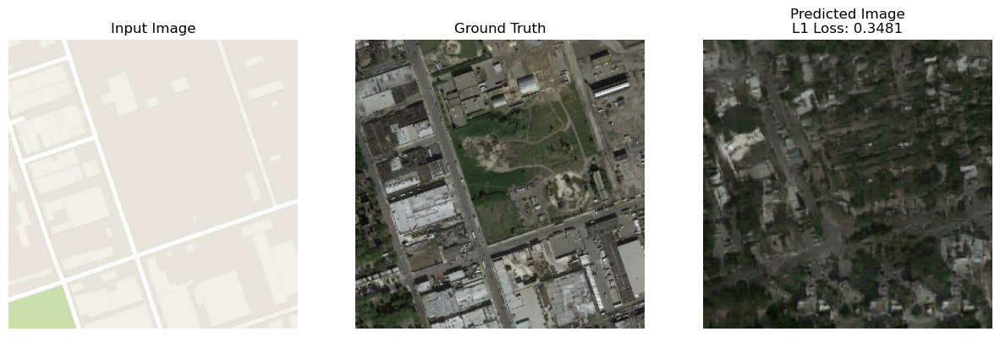

Epoch: 81, Step: 1096, Gen Loss: 13.9529, Disc Loss: 1.5687
Epoch: 82, Step: 1096, Gen Loss: 25.4301, Disc Loss: 0.4276
Epoch: 83, Step: 1096, Gen Loss: 23.9487, Disc Loss: 0.6375
Epoch: 84, Step: 1096, Gen Loss: 26.7802, Disc Loss: 0.6624
Epoch: 85, Step: 1096, Gen Loss: 17.7808, Disc Loss: 0.5465
Epoch: 86, Step: 1096, Gen Loss: 26.8339, Disc Loss: 1.0005
Epoch: 87, Step: 1096, Gen Loss: 22.4585, Disc Loss: 1.3378
Epoch: 88, Step: 1096, Gen Loss: 23.5596, Disc Loss: 0.5502
Epoch: 89, Step: 1096, Gen Loss: 19.9028, Disc Loss: 0.3656
Epoch: 90, Step: 1096, Gen Loss: 20.1288, Disc Loss: 2.5172


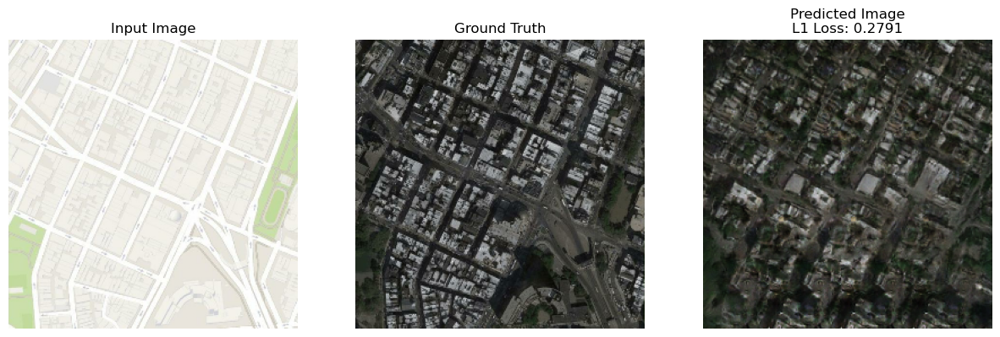

Epoch: 91, Step: 1096, Gen Loss: 32.0882, Disc Loss: 0.1719
Epoch: 92, Step: 1096, Gen Loss: 28.7453, Disc Loss: 0.0282
Epoch: 93, Step: 1096, Gen Loss: 7.0694, Disc Loss: 0.74130
Epoch: 94, Step: 1096, Gen Loss: 15.5645, Disc Loss: 2.5147
Epoch: 95, Step: 1096, Gen Loss: 27.5159, Disc Loss: 1.0113
Epoch: 96, Step: 1096, Gen Loss: 20.7652, Disc Loss: 0.9085
Epoch: 97, Step: 1096, Gen Loss: 31.7729, Disc Loss: 0.4422
Epoch: 98, Step: 1096, Gen Loss: 23.1670, Disc Loss: 0.4795
Epoch: 99, Step: 1096, Gen Loss: 12.4968, Disc Loss: 1.4739
Epoch: 100, Step: 1096, Gen Loss: 17.1628, Disc Loss: 1.1018


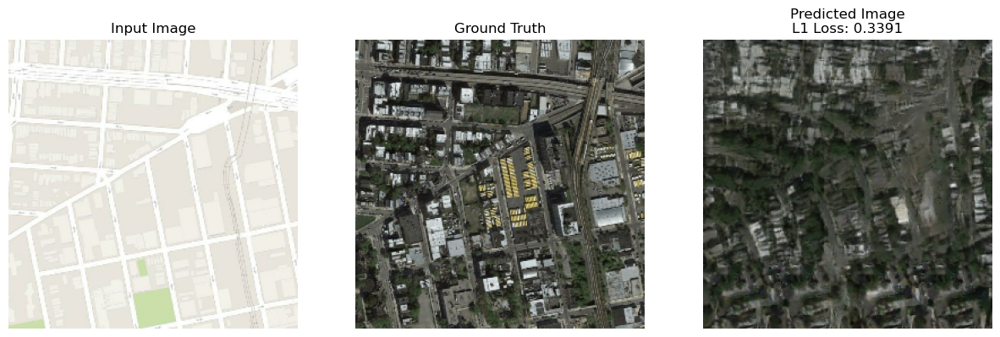

Epoch: 101, Step: 1096, Gen Loss: 6.7505, Disc Loss: 0.92377
Epoch: 102, Step: 1096, Gen Loss: 29.1327, Disc Loss: 0.1118
Epoch: 103, Step: 1096, Gen Loss: 27.5565, Disc Loss: 0.6209
Epoch: 104, Step: 1096, Gen Loss: 27.9149, Disc Loss: 1.2034
Epoch: 105, Step: 1096, Gen Loss: 3.6218, Disc Loss: 1.39990
Epoch: 106, Step: 1096, Gen Loss: 31.0489, Disc Loss: 0.5899
Epoch: 107, Step: 1096, Gen Loss: 33.7123, Disc Loss: 0.2475
Epoch: 108, Step: 1096, Gen Loss: 30.1858, Disc Loss: 0.3059
Epoch: 109, Step: 1096, Gen Loss: 16.1457, Disc Loss: 1.2396
Epoch: 110, Step: 1096, Gen Loss: 16.0685, Disc Loss: 0.4886


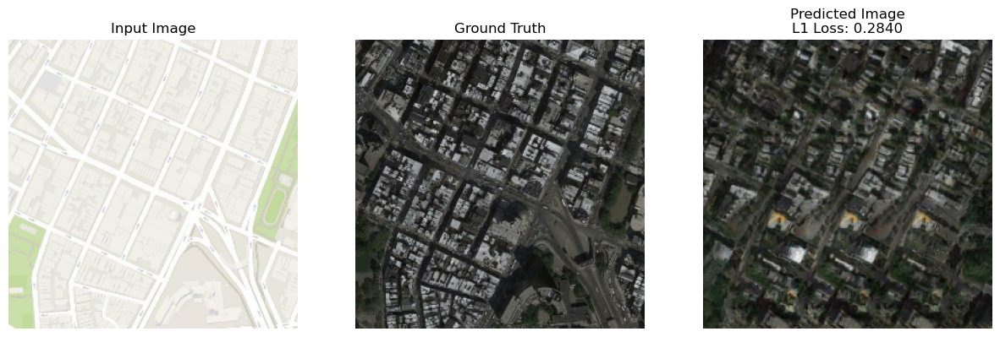

Epoch: 111, Step: 1096, Gen Loss: 25.6139, Disc Loss: 0.3831
Epoch: 112, Step: 1096, Gen Loss: 19.2218, Disc Loss: 0.8099
Epoch: 113, Step: 1096, Gen Loss: 4.1974, Disc Loss: 0.56879
Epoch: 114, Step: 1096, Gen Loss: 31.1303, Disc Loss: 0.2805
Epoch: 115, Step: 1096, Gen Loss: 18.8737, Disc Loss: 0.4984
Epoch: 116, Step: 1096, Gen Loss: 13.6573, Disc Loss: 0.4936
Epoch: 117, Step: 1096, Gen Loss: 27.7994, Disc Loss: 0.7268
Epoch: 118, Step: 1096, Gen Loss: 14.1096, Disc Loss: 0.7977
Epoch: 119, Step: 1096, Gen Loss: 23.1492, Disc Loss: 0.4920
Epoch: 120, Step: 1096, Gen Loss: 14.6230, Disc Loss: 1.7150


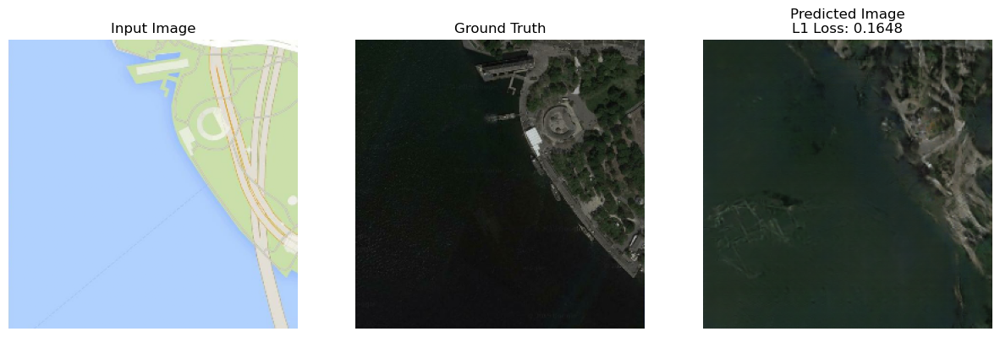

Epoch: 121, Step: 1096, Gen Loss: 28.7993, Disc Loss: 0.2176
Epoch: 122, Step: 1096, Gen Loss: 30.7836, Disc Loss: 0.0620
Epoch: 123, Step: 1096, Gen Loss: 25.7137, Disc Loss: 0.7039
Epoch: 124, Step: 1096, Gen Loss: 5.1719, Disc Loss: 0.76045
Epoch: 125, Step: 1096, Gen Loss: 33.8350, Disc Loss: 0.5457
Epoch: 126, Step: 1096, Gen Loss: 13.2517, Disc Loss: 0.9258
Epoch: 127, Step: 1096, Gen Loss: 26.6811, Disc Loss: 0.4915
Epoch: 128, Step: 1096, Gen Loss: 26.7842, Disc Loss: 0.7025
Epoch: 129, Step: 1096, Gen Loss: 27.4786, Disc Loss: 1.6426
Epoch: 130, Step: 1096, Gen Loss: 32.6354, Disc Loss: 0.1197


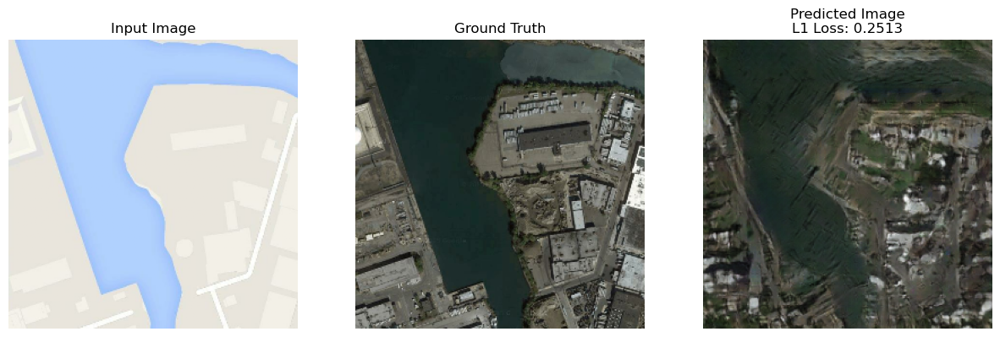

Epoch: 131, Step: 1096, Gen Loss: 25.8591, Disc Loss: 0.5490
Epoch: 132, Step: 1096, Gen Loss: 28.8474, Disc Loss: 0.3798
Epoch: 133, Step: 1096, Gen Loss: 30.2315, Disc Loss: 0.4732
Epoch: 134, Step: 1096, Gen Loss: 31.1165, Disc Loss: 0.2167
Epoch: 135, Step: 1096, Gen Loss: 18.6793, Disc Loss: 0.5473
Epoch: 136, Step: 1096, Gen Loss: 12.5835, Disc Loss: 0.3584
Epoch: 137, Step: 1096, Gen Loss: 30.1540, Disc Loss: 0.3609
Epoch: 138, Step: 1096, Gen Loss: 8.5548, Disc Loss: 0.65118
Epoch: 139, Step: 1096, Gen Loss: 26.3999, Disc Loss: 0.4164
Epoch: 140, Step: 1096, Gen Loss: 26.9192, Disc Loss: 0.7959


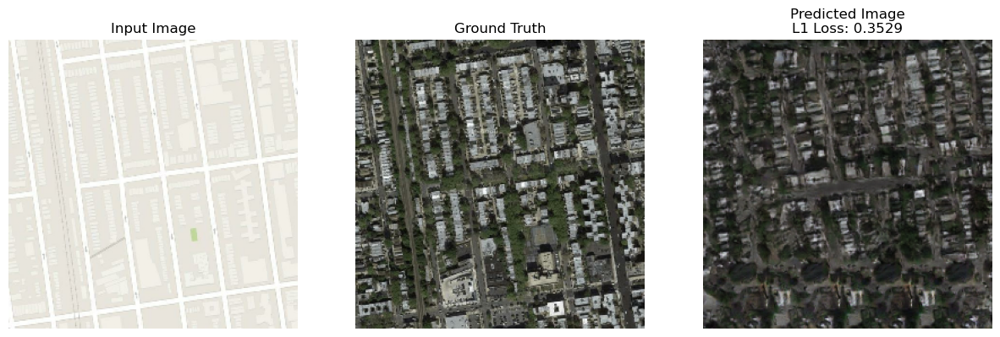

Epoch: 141, Step: 1096, Gen Loss: 21.5062, Disc Loss: 0.7054
Epoch: 142, Step: 1096, Gen Loss: 28.8515, Disc Loss: 0.5688
Epoch: 143, Step: 1096, Gen Loss: 25.3007, Disc Loss: 0.7309
Epoch: 144, Step: 1096, Gen Loss: 24.4768, Disc Loss: 0.4944
Epoch: 145, Step: 1096, Gen Loss: 26.0446, Disc Loss: 0.3272
Epoch: 146, Step: 1096, Gen Loss: 33.2831, Disc Loss: 0.0721
Epoch: 147, Step: 1096, Gen Loss: 11.3213, Disc Loss: 0.7730
Epoch: 148, Step: 1096, Gen Loss: 11.4211, Disc Loss: 2.1825
Epoch: 149, Step: 1096, Gen Loss: 23.2607, Disc Loss: 0.4123
Epoch: 150, Step: 1096, Gen Loss: 26.7920, Disc Loss: 0.4096


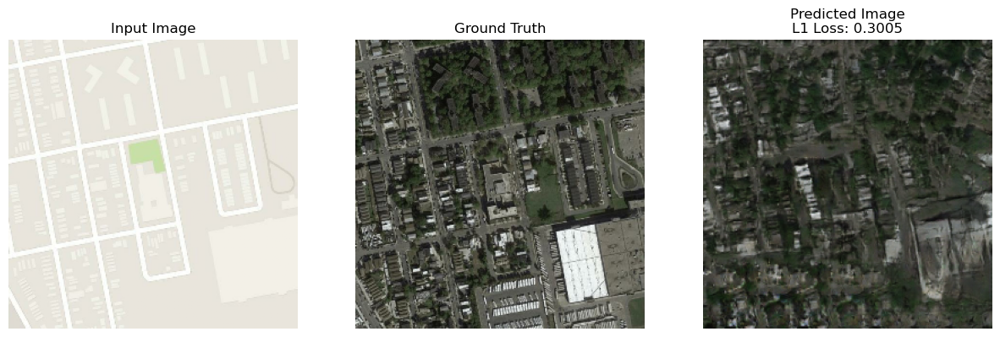

Epoch: 151, Step: 1096, Gen Loss: 29.5214, Disc Loss: 0.5401
Epoch: 152, Step: 1096, Gen Loss: 29.5542, Disc Loss: 0.2504
Epoch: 153, Step: 1096, Gen Loss: 25.3021, Disc Loss: 0.5393
Epoch: 154, Step: 1096, Gen Loss: 30.1233, Disc Loss: 0.4495
Epoch: 155, Step: 1096, Gen Loss: 30.3552, Disc Loss: 0.2194
Epoch: 156, Step: 1096, Gen Loss: 13.7509, Disc Loss: 1.3744
Epoch: 157, Step: 1096, Gen Loss: 27.4083, Disc Loss: 1.0812
Epoch: 158, Step: 1096, Gen Loss: 19.7758, Disc Loss: 1.4423
Epoch: 159, Step: 1096, Gen Loss: 29.7482, Disc Loss: 0.9181
Epoch: 160, Step: 1096, Gen Loss: 8.9278, Disc Loss: 0.69096


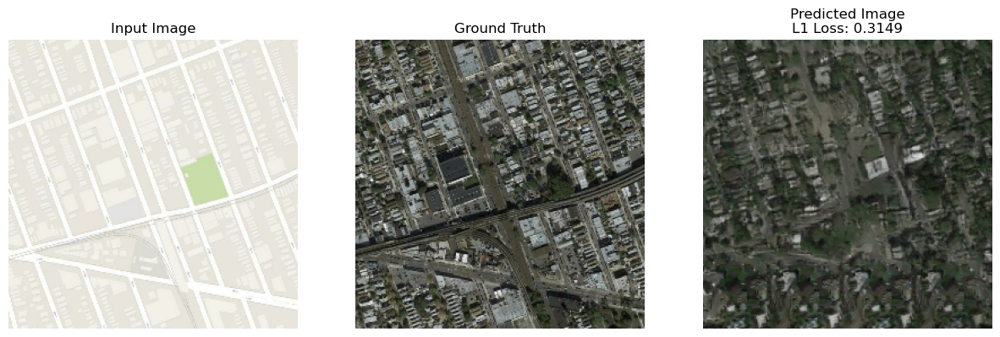

Epoch: 161, Step: 1096, Gen Loss: 18.1500, Disc Loss: 0.8837
Epoch: 162, Step: 1096, Gen Loss: 27.9569, Disc Loss: 0.4893
Epoch: 163, Step: 1096, Gen Loss: 13.6668, Disc Loss: 1.4689
Epoch: 164, Step: 1096, Gen Loss: 30.7836, Disc Loss: 0.3347
Epoch: 165, Step: 1096, Gen Loss: 15.2282, Disc Loss: 0.4801
Epoch: 166, Step: 1096, Gen Loss: 34.3005, Disc Loss: 0.3343
Epoch: 167, Step: 1096, Gen Loss: 25.9527, Disc Loss: 0.1451
Epoch: 168, Step: 1096, Gen Loss: 36.0402, Disc Loss: 0.2693
Epoch: 169, Step: 1096, Gen Loss: 36.4102, Disc Loss: 0.4108
Epoch: 170, Step: 1096, Gen Loss: 5.9784, Disc Loss: 0.44257


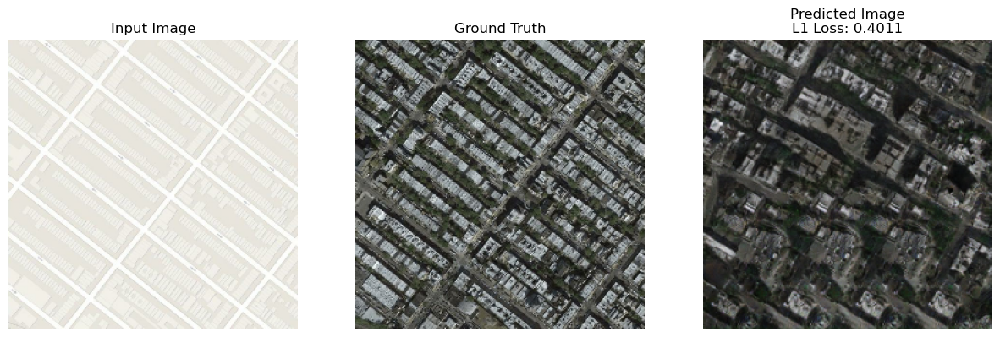

Epoch: 171, Step: 1096, Gen Loss: 10.3343, Disc Loss: 1.0868
Epoch: 172, Step: 1096, Gen Loss: 27.6554, Disc Loss: 1.2196
Epoch: 173, Step: 1096, Gen Loss: 14.7923, Disc Loss: 0.3989
Epoch: 174, Step: 1096, Gen Loss: 15.8459, Disc Loss: 0.8415
Epoch: 175, Step: 1096, Gen Loss: 24.5783, Disc Loss: 0.2235
Epoch: 176, Step: 1096, Gen Loss: 31.9635, Disc Loss: 0.6633
Epoch: 177, Step: 1096, Gen Loss: 29.7849, Disc Loss: 0.5009
Epoch: 178, Step: 1096, Gen Loss: 16.9656, Disc Loss: 0.7803
Epoch: 179, Step: 1096, Gen Loss: 14.0776, Disc Loss: 0.7148
Epoch: 180, Step: 1096, Gen Loss: 5.0704, Disc Loss: 0.46985


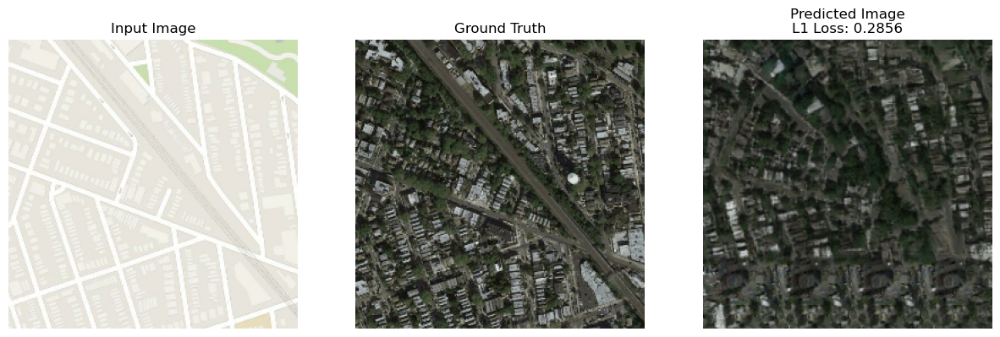

Epoch: 181, Step: 1096, Gen Loss: 14.7202, Disc Loss: 1.1554
Epoch: 182, Step: 1096, Gen Loss: 14.8703, Disc Loss: 1.6306
Epoch: 183, Step: 1096, Gen Loss: 13.9211, Disc Loss: 0.7768
Epoch: 184, Step: 1096, Gen Loss: 26.1466, Disc Loss: 0.4316
Epoch: 185, Step: 1096, Gen Loss: 33.3667, Disc Loss: 0.1796
Epoch: 186, Step: 1096, Gen Loss: 25.6996, Disc Loss: 0.4395
Epoch: 187, Step: 1096, Gen Loss: 21.2538, Disc Loss: 0.2043
Epoch: 188, Step: 1096, Gen Loss: 15.5812, Disc Loss: 1.2207
Epoch: 189, Step: 1096, Gen Loss: 7.2220, Disc Loss: 1.37118
Epoch: 190, Step: 1096, Gen Loss: 22.8976, Disc Loss: 0.1767


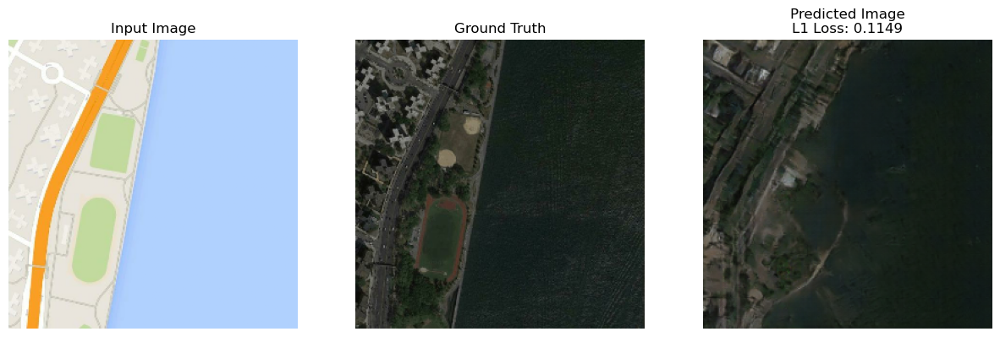

Epoch: 191, Step: 1096, Gen Loss: 11.7270, Disc Loss: 0.6598
Epoch: 192, Step: 1096, Gen Loss: 30.8681, Disc Loss: 0.2406
Epoch: 193, Step: 1096, Gen Loss: 8.3189, Disc Loss: 0.28440
Epoch: 194, Step: 1096, Gen Loss: 30.2429, Disc Loss: 0.1663
Epoch: 195, Step: 1096, Gen Loss: 19.2452, Disc Loss: 0.8034
Epoch: 196, Step: 1096, Gen Loss: 26.4493, Disc Loss: 0.4479
Epoch: 197, Step: 1096, Gen Loss: 36.8641, Disc Loss: 0.1078
Epoch: 198, Step: 1096, Gen Loss: 29.7439, Disc Loss: 0.8792
Epoch: 199, Step: 1096, Gen Loss: 28.4374, Disc Loss: 0.4810
Epoch: 200, Step: 1096, Gen Loss: 18.6306, Disc Loss: 1.0870


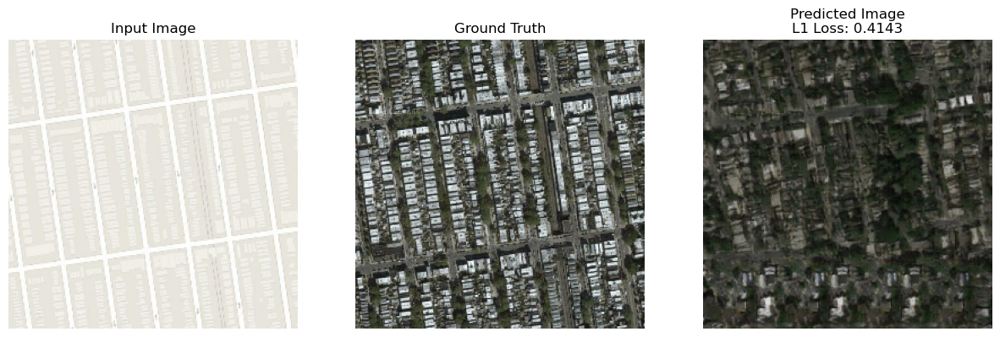

In [10]:
run = wandb.init(config=config, project="pix2pix")

fit(
    train_data=train,
    val_data=val,
    epochs=config["epochs"],
    generator=G,
    discriminator=D,
    generator_optimizer=g_optim,
    discriminator_optimizer=d_optim,
    l1_lambda=config["l1_lambda"],
)

In [11]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
fake_d_loss,▃▆▃▅▆▅▁▅▅▅▃▅▅▅▇▄▆▆▆█▇█▇▇▅█▆▇██▇▇▆▇█▄▇▇█▆
fake_d_real_class_loss,▇▆▅▃▅▄█▄▅▅▅▃▃▄▃▄▄▄▄▂▃▃▄▃▅▄▅▄▂▃▄▂▂▁▃▆▃▂▃▃
l1_loss,▆▆█▆▅▆▂▅▅▄▂▅▅▄▄▂▃▃▃▅▄▄▄▅▁▃▃▃▅▄▃▅▂▅▅▃▄▄▂▂
real_d_loss,▄▆▄▆▅▆▁▅▅▆▅▆▇▄▇▆▆▇▆█▅▆▆█▄▅▆▆▇█▇▅▆█▆▃▆▆▇▆
total_disc_loss,▃▆▄▆▆▅▁▅▅▆▄▆▆▅▇▅▆▆▆█▆▇▆▇▄▇▆▇██▇▆▇█▇▃▇▇▇▆
total_gen_loss,█▇█▅▆▆▅▅▅▄▄▄▄▄▃▃▂▃▃▄▃▃▄▄▂▃▃▃▃▃▄▄▁▂▄▅▃▃▁▂
epoch,200
fake_d_loss,0.31949
fake_d_real_class_loss,2.36479
l1_loss,0.20561
